# **Microproyecto 1:** *Generación de paleta de colores a partir de imágenes con técnicas de ML No Supervisado*

El objetivo de este `Notebook` es implementar una solución que, a partir del uso de métodos de `Unsupervised Machine Learning`, como lo son técnicas de `Clustering` y `Reducción de Dimensionalidad`, sea capaz de **generar un conjunto de tonos utilizados en una representación visual**, en otras palabras, una **paleta de colores** a partir de una imagen dada.

El siguiente diagrama muestra la metodología a desarrollar:

**Input Imagen** (JPEG, PNG) $\to$ **Preprocesamiento** $\to$ **Representación** $\to$ **`Clustering`** $\to$ **Postprocesamiento** $\to$ **Output** - `Centroides` RGB (Paleta de Colores) $\to$ **Imagen Recoloreada** $\to$ Visualización 2D de los datos (Vectores RGB)

**Imports**

In [ ]:
import os
import time
import re
import numpy as np
import pandas as pd
import cv2 as cv
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import warnings

from sklearn.base import BaseEstimator, TransformerMixin, clone

#* Clustering methods
from sklearn.cluster import KMeans, DBSCAN, MeanShift

#* Dimensionality reduction methods
from sklearn.manifold import TSNE

#* Metrics for model evaluation
from sklearn.metrics import silhouette_score, davies_bouldin_score

from sklearn.model_selection import ParameterGrid

from sklearn.pipeline import Pipeline

warnings.filterwarnings(
    'ignore',
    category = FutureWarning,
    message = '.*Pipeline instance is not fitted yet.*'
)

# **1. Recopilación de las imágenes**

La recolección de datos (*ie.* `imágenes`) se llevó a cabo descargando cada una de estas a partir de la colección de imágenes [WikiArt](https://www.kaggle.com/datasets/steubk/wikiart). Este `Dataset` fue construido a partir de las imágenes disponibles en WikiArt.org, y constan de:
- $80.020$ imágenes de $1.119$ artistas
- $27$ estilos artísticos. 

Cabe recalcar que estas imágenes incorporan un preprocesamiento para facilitar su uso:

- *Upscaled* (Ampliado)
- *Resized* (Re-dimensionado)

## **1.1. Muestreo**

Los criterios para seleccionar los datos (`imágenes`) desarrollar y evaluar nuestra solución fueron los siguientes:

1. Incorporar una muestra con **estilos artísticos diversos** ($\approx 4$)
2. Que las imágenes presentaran un conjunto estéticamente atractivo de colores, que resultara interesante de analizar y extraer para evaluar el desempeño de nuestra solución.
3. Incorporar obras artísticas reconocidas para también facilitar una evaluación visual de nuestra implementación.

<table>
  <tr>
    <td><img src="data/Modern_eugene-grasset_danger-1897.jpg" width="300"></td>
    <td>Cartel de estilo Art Nouveau con figuras estilizadas. Predomina una paleta de tonos anaranjados, marrones y rojos, contrastados con detalles en negro.</td>
  </tr>

  <tr>
    <td><img src="data/Abstract_Expressionism_alice-baber_lavender-high-1968.jpg" width="300"></td>
    <td>Obra abstracta de gran dinamismo cromático. Se destacan los azules intensos, blancos luminosos y rojos vibrantes en un fondo claro.</td>
  </tr>

  <tr>
    <td><img src="data/High_Renaissance_leonardo-da-vinci_madonna-litta-madonna-and-the-child.jpg" width="300"></td>
    <td>Pintura renacentista de composición equilibrada. La paleta se compone de azules profundos, dorados suaves y tonos piel cálidos.</td>
  </tr>

  <tr>
    <td><img src="data/Fauvism_andre-derain_effect-of-sun-on-the-water-london-1906.jpg" width="300"></td>
    <td>Paisaje fauvista con pinceladas vibrantes. Resaltan azules, verdes brillantes, amarillos intensos y naranjas cálidos.</td>
  </tr>

  <tr>
    <td><img src="data/Post_Impressionism_vincent-van-gogh_the-starry-night-1889.jpg" width="300"></td>
    <td>Pintura icónica del Postimpresionismo con espirales dinámicas. La paleta combina negro, azules profundos, amarillos brillantes y toques de blanco.</td>
  </tr>

  <tr>
    <td><img src="data/Post_Impressionism_david-burliuk_winter-still-life-1947.jpg" width="300"></td>
    <td>Naturaleza muerta invernal de tonos intensos. Predominan azules fríos, rojos fuertes, amarillos brillantes y acentos en blanco.</td>
  </tr>

  <tr>
    <td><img src="data/Impressionism_claude-monet_san-giorgio-maggiore-at-dusk.jpg" width="300"></td>
    <td>Paisaje impresionista al atardecer. La paleta está formada por rosas, lilas, naranjas cálidos y azules suaves reflejados en el agua.</td>
  </tr>

  <tr>
    <td><img src="data/Post_Impressionism_spyros-papaloukas_holy-mountain-1924.jpg" width="300"></td>
    <td>Paisaje postimpresionista con formas geométricas. Destacan verdes intensos, azules suaves y tonos terrosos rojizos.</td>
  </tr>
</table>

## **2. Exploración de datos**

El objetivo de esta sección es explorar las imágenes recolectadas, tanto en su representación visual como matricial. Esto es con el fin de identificar estrategias de preparación de datos útiles para asegurar una solución apropiada en términos de cómputo, tiempo y desempeño.

Definición de las rutas y funciones auxiliares para importar los datos (`imágenes`):

In [3]:
root_path = os.getcwd()
img_path = os.path.join(root_path, 'data')

In [4]:
def get_image_paths(images_path: str):
    if not os.path.exists(images_path):
        raise FileNotFoundError(f"Path not found: {images_path}")

    pat = re.compile(r'^.+\.(?:png|jpg|jpeg)$', re.IGNORECASE)
    img_names = [os.path.join(images_path, f) for f in os.listdir(images_path) if pat.match(f)]

    if not img_names:
        raise ValueError(f"No images found in {images_path}")
    return img_names

def load_image(img_path: str):
    try:
        img = cv.imread(img_path)
        rgb_img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    except Exception as e:
        raise IOError(f"Failed to read {img}")
    return rgb_img

### **2.1. Visualización de los datos**

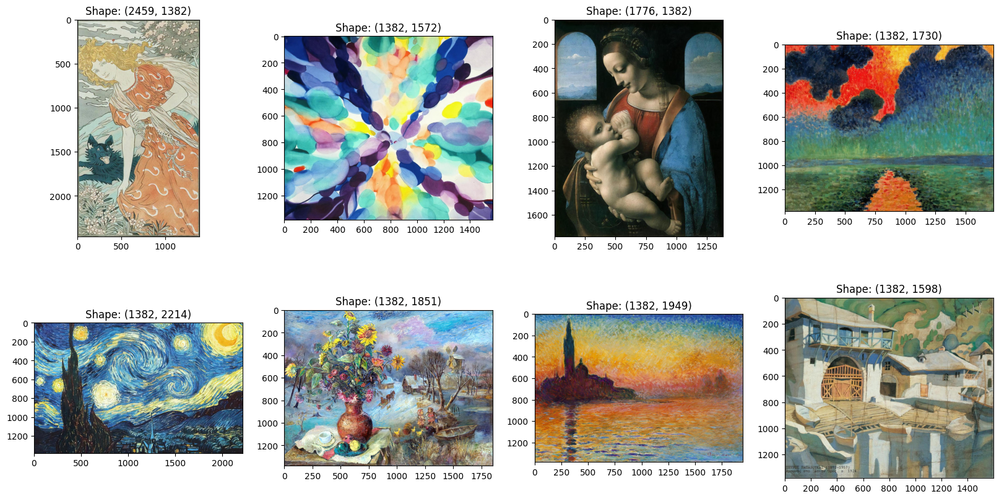

In [ ]:
img_files = get_image_paths(img_path)
imgs = [load_image(f) for f in img_files]

n_cols = 4
n_rows = len(imgs) // n_cols

fig, axs = plt.subplots(n_rows, n_cols, figsize = (20, 10))
for ax, img in zip(axs.flatten(), imgs):
    ax.imshow(img)
    ax.set_title(f'Shape: {img.shape[:2]}')
    # ax.axis("off")

mean_n_pixels = np.mean([img.shape[0] * img.shape[1] for img in imgs])

Se puede evidenciar la **variedad de colores** que tiene la muestra seleccionada. Adicionalmente, cabe resaltar la diferencia en tamaño de cada una de las muestras y la gran cantidad de pixeles en cada una. Esta gran cantidad de pixeles teniendo un mínimo y máximo de $1382$ y $2459$ respectivamente supondrán un reto en términos de tiempo de cómputo para ejecutar los algoritmos de `aprendizaje no supervisado`. Debido a esto, resulta conveniente incorporar una técnica de `resizing` de imágenes con el objetivo de disminuir dicho reto de tiempo y cómputo.

A continuación se compararán 2 alternativas de `resizing`:
1. *Resizing* con `ancho` y `alto` fijos e iguales
2. *Resizing* con `ancho` fijo y `alto` definido para mantener el `aspect ratio`

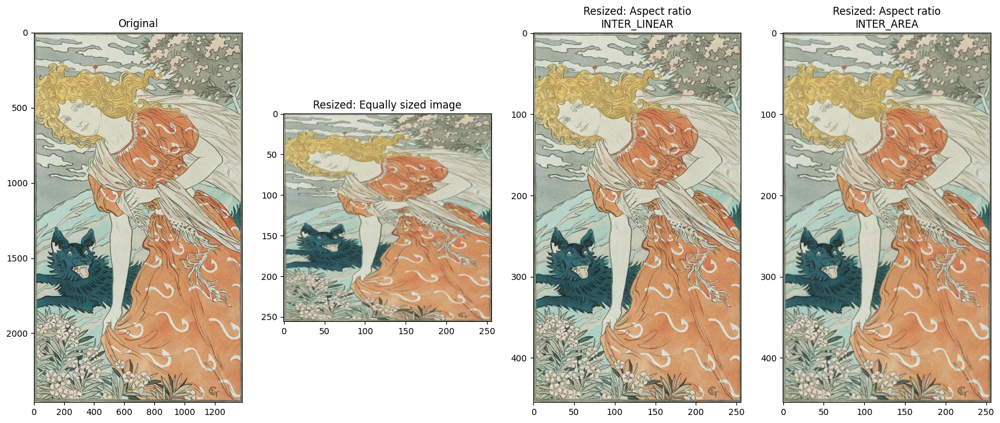

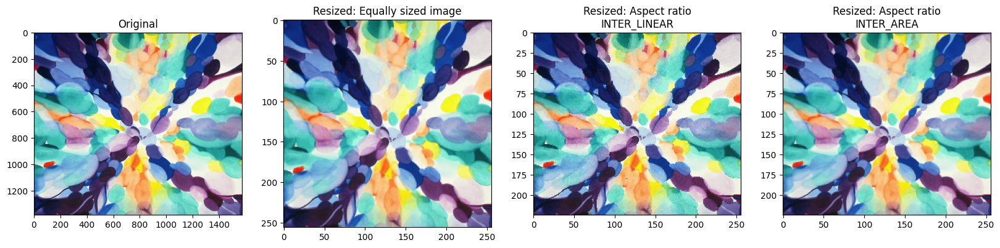

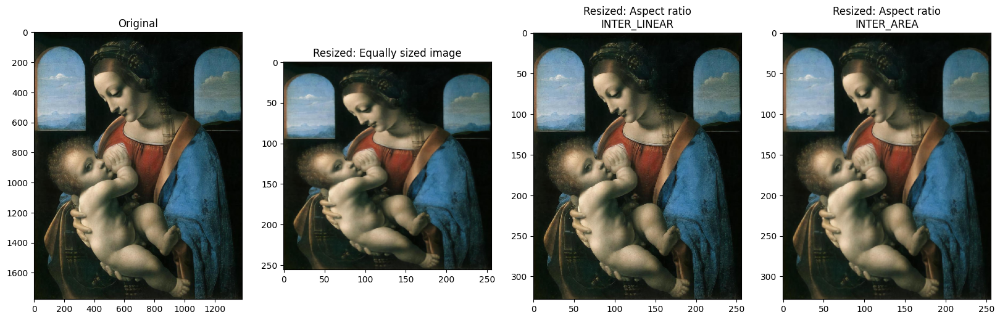

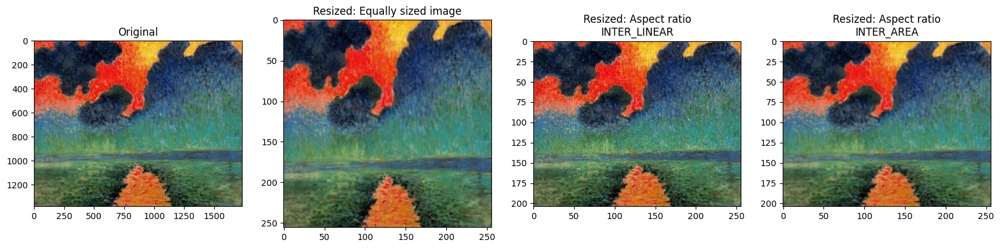

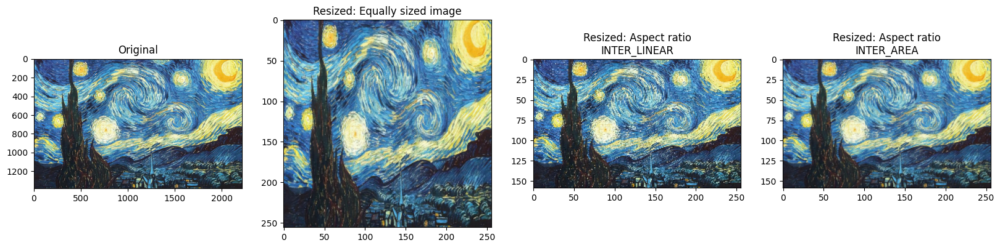

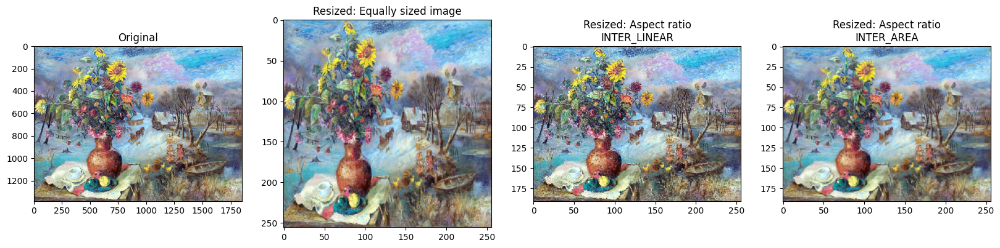

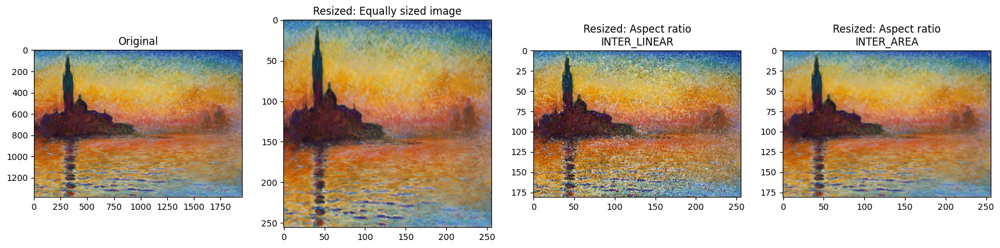

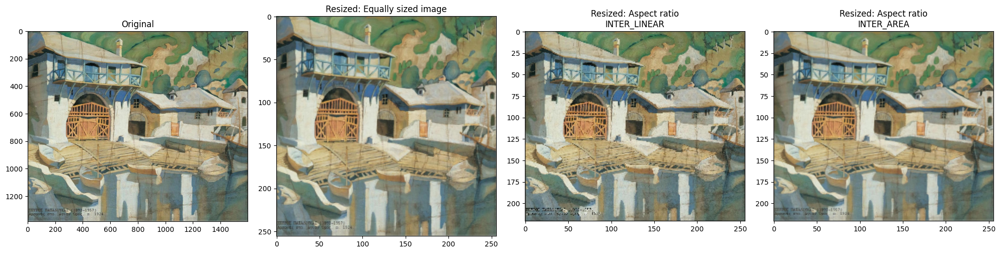

In [6]:
for img in imgs:
    fig, ax = plt.subplots(1, 4, figsize = (20, 15))
    original_height, original_width = img.shape[:2]
    new_width = 256
    aspect_ratio = new_width / original_width
    new_height = int(original_height * aspect_ratio)

    equal_img = cv.resize(img, (new_width, new_width), interpolation = cv.INTER_AREA)
    resized_img_linear = cv.resize(img, (new_width, new_height), interpolation = cv.INTER_LINEAR) # Speed
    resized_img_area = cv.resize(img, (new_width, new_height), interpolation = cv.INTER_AREA) # Best for shrinking
    ax[0].imshow(img)
    ax[1].imshow(equal_img)
    ax[2].imshow(resized_img_linear)
    ax[3].imshow(resized_img_area)

    ax[0].set_title("Original")
    ax[1].set_title("Resized: Equally sized image")
    ax[2].set_title("Resized: Aspect ratio\nINTER_LINEAR")
    ax[3].set_title("Resized: Aspect ratio\nINTER_AREA")

plt.tight_layout()

Con base en los resultados visuales de las alternativas de *`resizing`*, la alternativa que **produce resultados más fieles a la imagen original** es conservar el `aspect ratio` y usar la `interpolación`: `INTER_AREA`, la cual genera cada pixel como un promedio ponderado del área cubierta en la imagen original, **evitando** así el `aliasing` (transiciones bruscas de color) que produce `INTER_LINEAR`. Ahora, si bien es evidente cómo se degrada la resolución de la imagen con el uso de estrategias de `resizing`, dado que el **objetivo** de nuestra implementación es lograr un buen ***trade-off*** entre cómputo y tiempo de ejecución, vale la pena evaluar la calidad de los resultados sobre la imagen original y la versión *resized* con la estrategia elegida.

### **2.2. Conclusiones de exploración de datos**

La exploración de las imágenes sugiere las siguientes conclusiones y alternativas de procesamiento:

- **Tamaño de datos** - Las imágenes constan de una gran número de pixeles, teniendo la más grande unos $2459 \times 1382 = 3.398.338$ de estos.
- **Usar *resizing*** - El gran número de pixeles supone un reto en términos de cómputo y tiempo de ejecución de los métodos no supervisados, por lo que se usará una estrategia de *resizing* para gestionarlo.
- **Resizing elegido** - De las estrategias evaluadas visualmente, la estrategia de *resizing* que produce una imagen más fiel a la original es conservar el *aspect ratio* y usar la interpolación `INTER_AREA`.
- **Comparación y evaluación de resultados** - Comparar el tiempo de ejecución y la calidad de los resultados, usando tanto la imagen original como la encogida para así validar si la remoción de información brinda beneficios en tiempo y resultados equiparables.

## **3. Creación del *Pipeline* para pre-procesamiento de datos**

En esta sección se **unifica** la serie de transformaciones definidas en la exploración de datos para pre-procesar las imágenes, con el fin de que estas cumplan con el formato elegido y con los requerimientos de los métodos no supervisados a implementar.

Para esta unificación se emplea la clase [`Pipeline`](https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html) de `scikit-learn`, la cual permite aplicar de manera secuencial una lista de `transformers` para pre-procesar los datos. La documentación resalta que los pasos del *pipeline* deben de ser `transformers`, es decir, **clases** que implementen los métodos `transform` y/o `fit_transform`: 

> *Intermediate steps of the pipeline must be transformers, that is, they must implement fit and transform methods.*

El formato a usar para la creación de *scikit-learn transformers* es:

```python
class TransformerName(BaseEstimator, TransformerMixin):
    def __init__(...):
        pass
    def fit(...):
        pass
    def transform(...):
        pass
    def get_feature_names_out(...): # Optional
        pass
```

In [7]:
class LoadImage(BaseEstimator, TransformerMixin):
    def __init__(self, to_rgb: bool = True):
        self.to_rgb = to_rgb

    def fit(self, X, y = None): # Does nothing
        return self

    def transform(self, X):
        img = cv.imread(X)
        if img is None:
            raise IOError(f"Failed to read {img}")
        if self.to_rgb:
            img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        return img

class ResizeImage(BaseEstimator, TransformerMixin):
    def __init__(self, new_width: int = 256):
        self.new_width = new_width

    def fit(self, X, y = None): # Does nothing
        return self

    def transform(self, X):
        h, w = X.shape[:2]
        aspect_ratio = self.new_width / w
        self.new_height = int(h * aspect_ratio)
        resized_img = cv.resize(
            X, (self.new_width, self.new_height), 
            interpolation = cv.INTER_AREA
        )
        return resized_img


Nuesto **objeto de estudio** son colores, es decir, **`vectores` RGB** por lo que es necesario cambiar la representación de la imagen aplanándola a un conjunto `filas` de estos vectores:

In [8]:
class FlatImage(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.original_shape_ = None
    
    def fit(self, X, y = None): # Does nothing
        return self
    
    def transform(self, X):
        self.original_shape_ = X.shape
        return X.reshape((-1, 3)) # RGB Vectors
    
    def inverse_transform(self, X_flat):
        if self.original_shape_ is None:
            raise ValueError('Original image shape is not known')
        else:
            return X_flat.reshape(self.original_shape_)


Debido a que se usarán **métodos no supervisados**, los cuales definen `similitud` o `densidad` de acuerdo a **métricas de `distancia`** para hallar los `clusters`, es útil **normalizar** los datos para mejorar la calidad de los resultados:

In [9]:
class NormalizeImage(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self, X, y = None): # Does nothing
        return self
    
    def transform(self, X):
        return X / 255.0

In [ ]:
loader = LoadImage(to_rgb = True)
resizer = ResizeImage(new_width = 256)
normalizer = NormalizeImage()
flattener = FlatImage()

steps = [
    ("load", loader),
    ("resize", resizer),
    ("flatten", flattener),
    ("normalize", normalizer)
]

preproc_orig = Pipeline(steps = [steps[0]] + steps[2:]) # Pipeline using original image for comparison with resized one.
preproc_resize = Pipeline(steps = steps)

Esquema pipeline:

*LoadImage* $\to$ *ResizeImage* $\to$ *FlatImage* $\to$ *NormalizeImage* $\to$ Apply Model $\to$ Generate Results: Color palette, Segmented Image & t-SNE

## **4. Modelo de *Clustering***

### **4.1. Elección de clases de modelo**

Puesto que el **objeto de estudio** son **colores**:
- Los algoritmos basados en `Prototipos` (ej. `KMeans`) identificarán los colores (grupos) predominantes en la imagen y los $K$ centroides representarán la paleta de la imagen en cuestión.

- Los algoritmos **basados en Densidad** (ej. `DBSCAN`), por la naturaleza de estos, podrían identificar tanto colores predominantes como colores raros (áreas pequeñas pero densas) y se deberá usar un **post-procesamiento** para la generación de un "pseudo-prototipo" como la media o mediana de cada `cluster` para generar la paleta de colores.

### **4.2. Metodología para entrenamiento**


El entrenamiento de algoritmos o modelos de **aprendizaje no supervisado** difiere respecto al de **aprendizaje supervisado**, en la medida de que estos no requieren una **etiqueta** o variable `target` la cual guíe su entrenamiento. Estos, para el caso de agrupación, pretenden identificar un conjunto de `clusters` en la estructura subyacente de los datos, esto para revelar similitud, cohesion o cercanía entre estos y así facilitar análisis descriptivo y/o predictivo.

En esta sección, se define un conjunto de modelos y sus `hiperparámetros` para ser evaluados y encontrar la combinación que mejores resultados produzca. Como criterio de evaluación se usará el `Davies-Bouldin Index` que, si bien no es tan intuitiva su interpretación en comparación al `Silhouette Coefficient`, su cálculo es mucho más rápido.

##### **Consideraciones sobre modelos y *pipeline* utilizados**

- El `pipeline` que se usará es el que incorpora el `resizing` de la imagen puesto que, tras pruebas realizadas pero no incorporadas en el *Notebook* final, se evidenciaron tiempos hasta de más de 1h de procesamiento usando la imagen original, en comparación a apróx. 3 min usando el *pipeline* de escalamiento.

- El **modelo elegido** es `KMeans` dado su excelente balance entre **tiempo de cómputo** y **desempeño** , en comparación a los demás modelos probados:

    - `DBSCAN`: Su tiempo de entrenamiento fue hasta más del doble que el tiempo de entrenamiento para `KMeans`, además que visualmente este último producía una paleta de colores más fiel a la imagen original.
    - `MeanShift`: Tiempo de entrenamiento muy superior a `KMeans`, lo cual resulta contraproducente dado el objetivo de la solución: lograr un buen *trade-off* entre tiempo de cómputo y desempeño

#### **4.2.1. Funciones auxiliares para entrenamiento, evaluacion y resultados finales**

Para automatizar la generación de los modelos, su entrenamiento, evaluación y comparación; además de la generación de los resultados: Graficación de la imagen original/preprocesada, imagen segmentada, paleta de colores y visualización en 2D (*t-SNE*), se definen las siguientes funciones:

1. *`valid_model_configs`*: Toma una cuadrícula de modelos e hiperparámetros y genera las respectivas combinaciones válida.

2. *`param_search`*: Realiza la búsqueda de hiperparámetros y retorna el mejor modelo, mejores hiperparámetros, mejor score y el resumen de resultados.

3. *`compute_palette`*: Dado el modelo y sus *labels*, retorna los centroides si existen, si no, los calcula como la media.

4. *`segment_image`*: Retorna la imagen segmentada a partir de los centroides y transformación inversa del 'aplanador'.

5. *`plot_tsne`*: Aplica *t-SNE* y grafica los respectivos clusters coloreándolos de acuerdo a la paleta generada.

6. *`analyze_image`*: Orquesta la utilización de todas las funcionalidades anteriores para generar los resultados.

In [ ]:
def valid_model_configs(param_grid):
    for alt in ParameterGrid(param_grid):
        model = clone(alt['model'])
        params = {k: v for k, v in alt.items() if k != 'model'}

        # Reglas de validación por tipo de modelo
        if model.__class__.__name__ == "KMeans":
            if 'n_clusters' not in params:
                continue  # saltar configuraciones inválidas

        if model.__class__.__name__ == "DBSCAN":
            if 'eps' not in params or 'min_samples' not in params:
                continue  # saltar configuraciones inválidas

        # Clonar el modelo con parámetros configurados
        model = model.set_params(**params)
        yield model, params

def param_search(X, param_grid: list[dict]):
    best_score = -1
    best_params = None
    best_model = None
    results = []

    for model, params in valid_model_configs(param_grid):
        start = time.perf_counter()
        model.fit(X)
        end = time.perf_counter()

        labels = model.labels_
        
        if len(set(labels)) < 2 or all(l == -1 for l in labels):
            score = -1
        else:
            # score = silhouette_score(X, labels)
            score = - davies_bouldin_score(X, labels) # Lower is better

        results.append({
            'model': model.__class__.__name__,
            'params': params,
            'score': score,
            'time': end - start
        })

        if score > best_score:
            best_score = score
            best_params = params
            best_model = model
    
    if best_model is None:
        raise ValueError('There were not valid clusters found.')
        
    return best_model, best_params, best_score, results

def compute_palette(X, labels, model):
    if hasattr(model, 'cluster_centers_'):
        centroids = model.cluster_centers_
    else:
        # DBSCAN: Compute mean per groupz
        centroids = np.array([
            X[labels == k].mean(axis = 0)
            for k in np.unique(labels) if k != -1
        ])
    return centroids

def segment_image(flat_img: np.ndarray, labels, centroids, flattener: FlatImage):
    segmented = centroids[labels]
    return flattener.inverse_transform(segmented)

def plot_tsne(X, labels, palette, ax, title = 't-SNE'):
    tsne = TSNE(n_components = 2, random_state = 42)
    x_tsne = tsne.fit_transform(X)

    # plt.figure(figsize = (6, 6))
    for k in np.unique(labels):
        if k == -1:
            color = 'k'
            label = 'Noise'
        else:
            color = palette[k] if len(palette) > k else np.random.rand(3,)
            label = f'Cluster {k}'
        
        ax.scatter(
            x_tsne[labels == k, 0], x_tsne[labels == k, 1], 
            c = [color], s = 3, label = label
        )
    ax.legend()
    ax.set_title(title)

def analyze_image(img_path, pipeline, param_grid):
    img = pipeline.transform(img_path)
    
    best_model, best_params, best_score, results = param_search(img, param_grid)
    labels = best_model.labels_
    palette = compute_palette(img, labels, best_model)

    # Reconstruction segmented image
    flattener = pipeline.named_steps['flatten']
    img_segmented = segment_image(img, labels, palette, flattener)

    fix, axs = plt.subplots(1, 4, figsize = (20, 5))

    # Original / Resized image
    axs[0].imshow(flattener.inverse_transform(img))
    axs[0].set_title('Original / Preprocesada')
    # axs[0].axis('off')

    # Segmented image
    axs[1].imshow(img_segmented)
    axs[1].set_title(f'Segmentada\n{best_model.__class__.__name__}: {best_params}')
    # axs[1].axis('off')

    # Color palette
    axs[2].imshow([palette])
    hex_colors = [mcolors.to_hex(c) for c in palette]
    axs[2].set_xticks(range(len(palette)))
    axs[2].set_xticklabels(
        [f'C{idx}\n{hex_col}' for idx, hex_col in enumerate(hex_colors)],
        rotation = 90, ha = 'right'
    )
    axs[2].set_yticks([])
    axs[2].set_title('Paleta')

    plot_tsne(img, labels, palette, axs[3], title = 't-SNE')

    plt.tight_layout()
    plt.show()
    return best_model, best_params, best_score, results


In [ ]:
param_grid = [
    {
        'model': [KMeans(random_state = 123, max_iter = 600)],
        'n_clusters': list(range(5, 15)),
    },
]

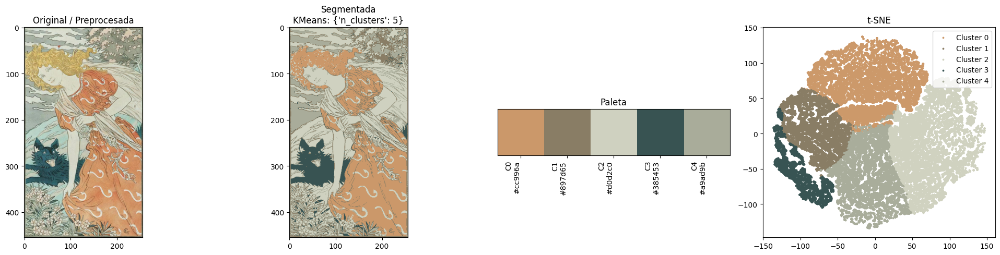

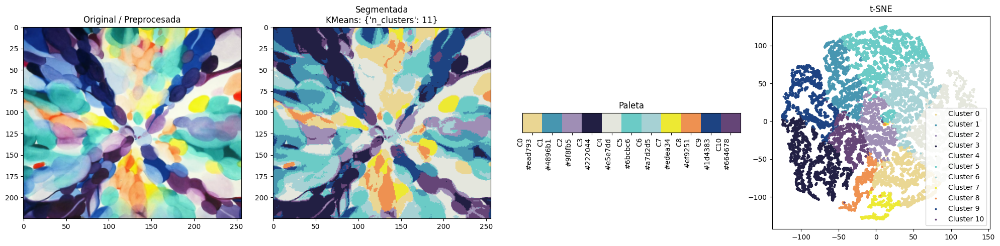

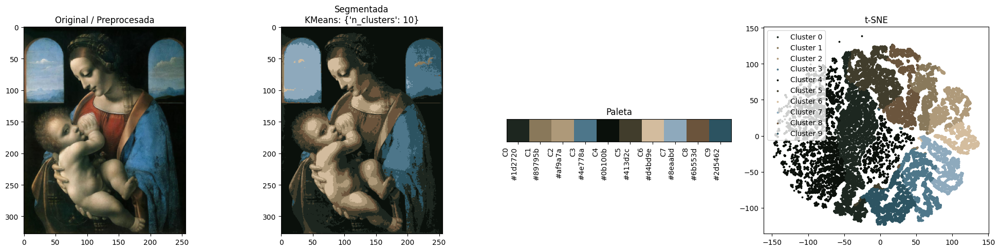

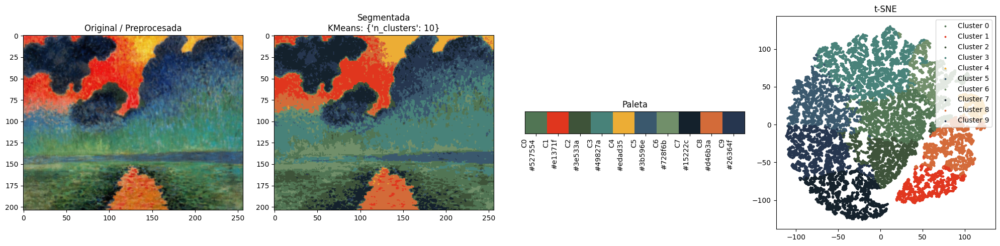

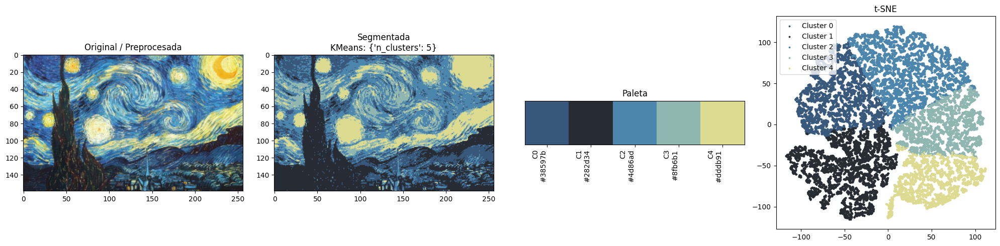

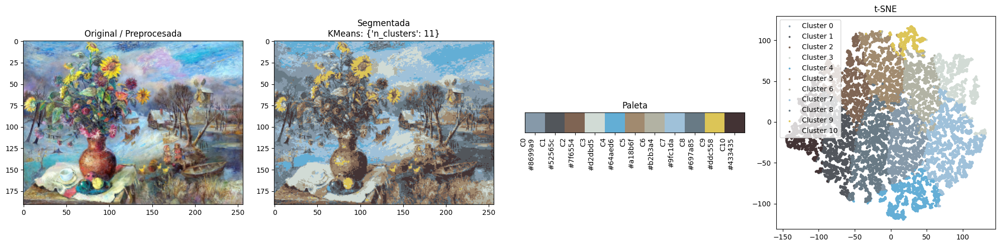

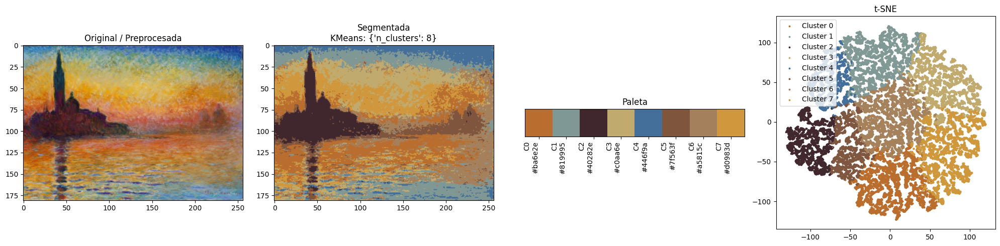

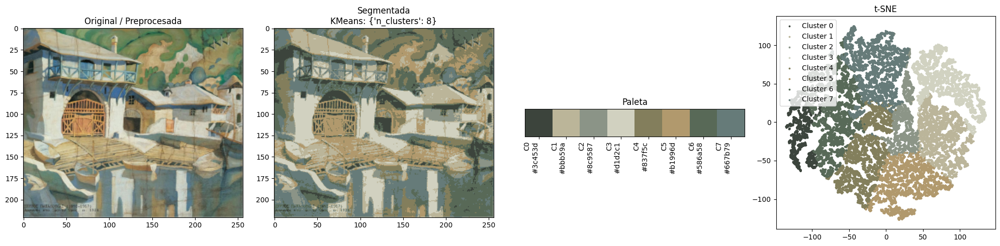

In [13]:
for image in img_files:
    best_model, best_params, best_score, results = analyze_image(image, preproc_resize, param_grid)

## **5. Conclusiones**

La implementación desarrollada en este `Notebook` logró exitosamente **generar paletas de colores** a partir de imágenes utilizando técnicas de `Machine Learning No Supervisado`. Los principales logros obtenidos fueron:

- **Extracción efectiva de paletas de colores** - El algoritmo `KMeans` demostró ser la opción más eficiente para identificar los colores predominantes en cada imagen, generando paletas estéticamente coherentes y fieles a las obras artísticas originales.

- **Optimización del procesamiento** - La estrategia de *resizing* con conservación del `aspect ratio` y interpolación `INTER_AREA` permitió reducir significativamente el tiempo de cómputo (de más de 1h a aproximadamente 3 minutos) sin comprometer la calidad visual de los resultados.

- **Pipeline robusto y reutilizable** - Se desarrolló un *pipeline* completo que integra todas las etapas del proceso: carga, preprocesamiento, clustering y visualización, facilitando la aplicación de la solución a nuevas imágenes.

- **Validación visual y técnica** - Los resultados muestran que las paletas extraídas capturan efectivamente los tonos característicos de diferentes estilos artísticos (Art Nouveau, Expresionismo Abstracto, Renacimiento, Fauvismo, Postimpresionismo e Impresionismo), mientras que la visualización `t-SNE` confirma la separación efectiva de los clusters de colores.

- **Balance óptimo cómputo-calidad** - La solución alcanzó el objetivo de lograr un excelente *trade-off* entre tiempo de procesamiento y fidelidad de los resultados, haciendo viable su aplicación práctica en análisis de imágenes.